# Get the Dataset

In [1]:
!wget https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip

--2025-11-05 22:56:30--  https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.205.73.112, 2600:1402:b800:797::317f, 2600:1402:b800:791::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.205.73.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  65.2MB/s    in 13s     

2025-11-05 22:56:43 (61.1 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

# Imports

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

# Dataframe

In [7]:
input_path = []
label = []

for class_name in os.listdir('PetImages/'):
    for path in os.listdir('PetImages/' + class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join('PetImages', class_name, path))
print(input_path[0])
print(label[0])

PetImages/Dog/8298.jpg
1


In [10]:
df = pd.DataFrame({'images': input_path, 'label': label})
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/12126.jpg,0
1,PetImages/Dog/7119.jpg,1
2,PetImages/Cat/10380.jpg,0
3,PetImages/Cat/5614.jpg,0
4,PetImages/Dog/12303.jpg,1


In [38]:
for i in df['images']:
    if 'db' in i:
        print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [40]:
import PIL
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        print(image)

PetImages/Cat/666.jpg
PetImages/Dog/11702.jpg


In [41]:
df = df[df['images'] != 'PetImages/Dog/Thumbs.db']
df = df[df['images'] != 'PetImages/Cat/Thumbs.db']
df = df[df['images'] != 'PetImages/Cat/666.jpg']
df = df[df['images'] != 'PetImages/Dog/11702.jpg']
len(df)

24998

# Explore the Data

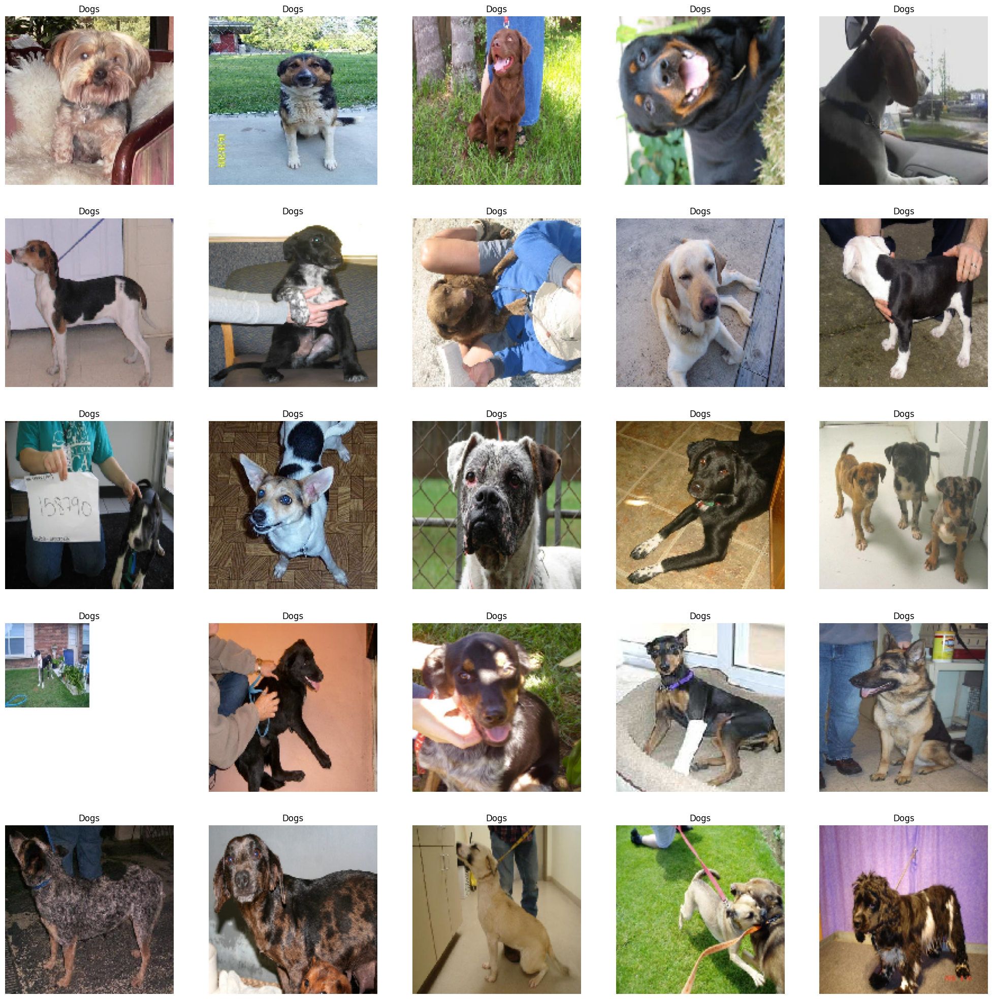

In [12]:
plt.figure(figsize=(25, 25)) #display grid of images
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp)-1)
files = temp[start:start+25]
for index, file in enumerate(files):
    plt.subplot(5, 5, index+1)
    img = load_img(file, target_size=(150, 150))
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

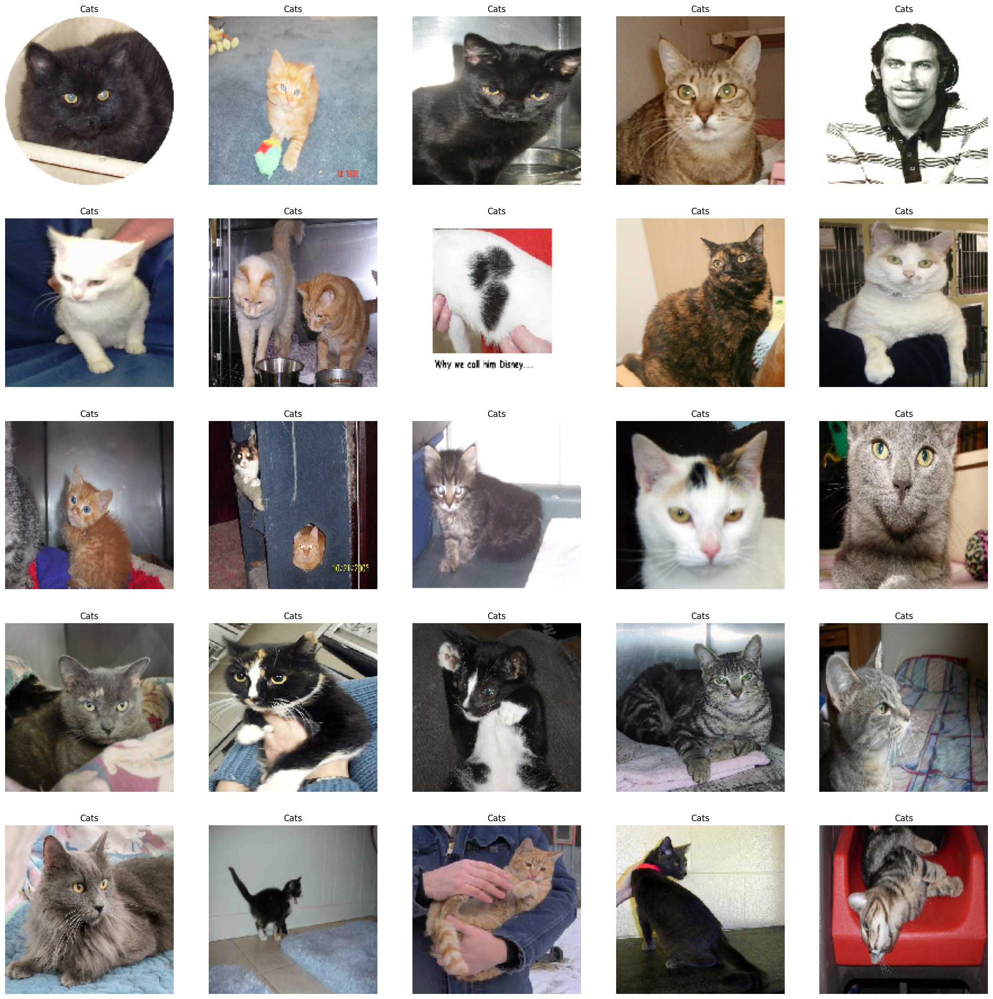

In [13]:
plt.figure(figsize=(25, 25)) #display grid of images
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp)-1)
files = temp[start:start+25]
for index, file in enumerate(files):
    plt.subplot(5, 5, index+1)
    img = load_img(file, target_size=(150, 150))
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

# Data Generator

In [42]:
df['label'] = df['label'].astype(str)

In [43]:
df.head()

,images,label
0,PetImages/Cat/12126.jpg,0
1,PetImages/Dog/7119.jpg,1
2,PetImages/Cat/10380.jpg,0
3,PetImages/Cat/5614.jpg,0
4,PetImages/Dog/12303.jpg,1


In [44]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [45]:
test.head()

,images,label
6869,PetImages/Cat/8404.jpg,0
22914,PetImages/Dog/105.jpg,1
9670,PetImages/Cat/8752.jpg,0
13641,PetImages/Dog/12265.jpg,1
23341,PetImages/Cat/1689.jpg,0


In [46]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(train, x_col='images', y_col='label', target_size=(128, 126), batch_size=512, class_mode='binary')

val_iterator = val_generator.flow_from_dataframe(test, x_col='images', y_col='label', target_size=(128, 126), batch_size=512, class_mode='binary')

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


# Model Creation

In [47]:
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(128, 126, 3)),
    MaxPooling2D(2, 2),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])


In [48]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 126, 124, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 63, 62, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 61, 60, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [49]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 294s 7s/step - accuracy: 0.5237 - loss: 0.7689 - val_accuracy: 0.6496 - val_loss: 0.6525
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 262s 7s/step - accuracy: 0.6471 - loss: 0.6369 - val_accuracy: 0.6812 - val_loss: 0.5987
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 258s 6s/step - accuracy: 0.6764 - loss: 0.6045 - val_accuracy: 0.7048 - val_loss: 0.5694
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 248s 6s/step - accuracy: 0.6998 - loss: 0.5691 - val_accuracy: 0.7264 - val_loss: 0.5387
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 259s 6s/step - accuracy: 0.7323 - loss: 0.5338 - val_accuracy: 0.6892 - val_loss: 0.5834
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 251s 6s/step - accuracy: 0.7170 - loss: 0.5511 - val_accuracy: 0.7656 - val_loss: 0.4851
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 247s 6s/step - accuracy: 0.7467 - loss: 0.5123 - val_accuracy: 0.7788 - val_loss: 0.4672
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 251s 6s/step - accuracy: 0.7379 - loss: 0.5292 - val_accuracy: 0.7762 - v

# Results

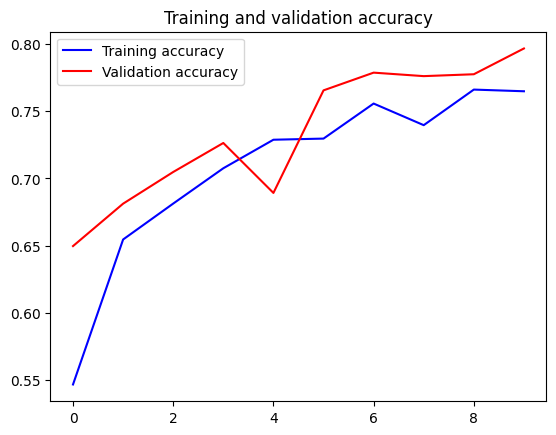

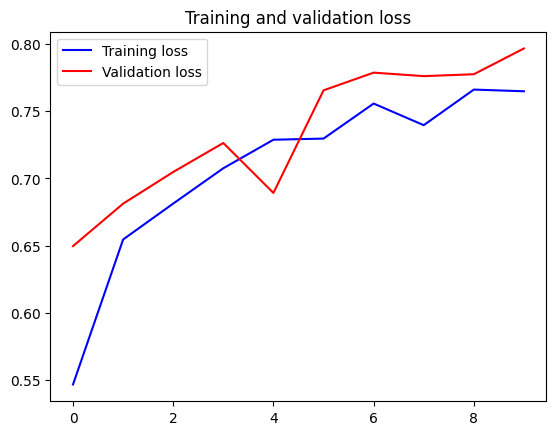

In [52]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

loss=history.history['loss']
val_loss=history.history['val_loss']

plt.plot(epochs, acc, 'b', label='Training loss')
plt.plot(epochs, val_acc, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()